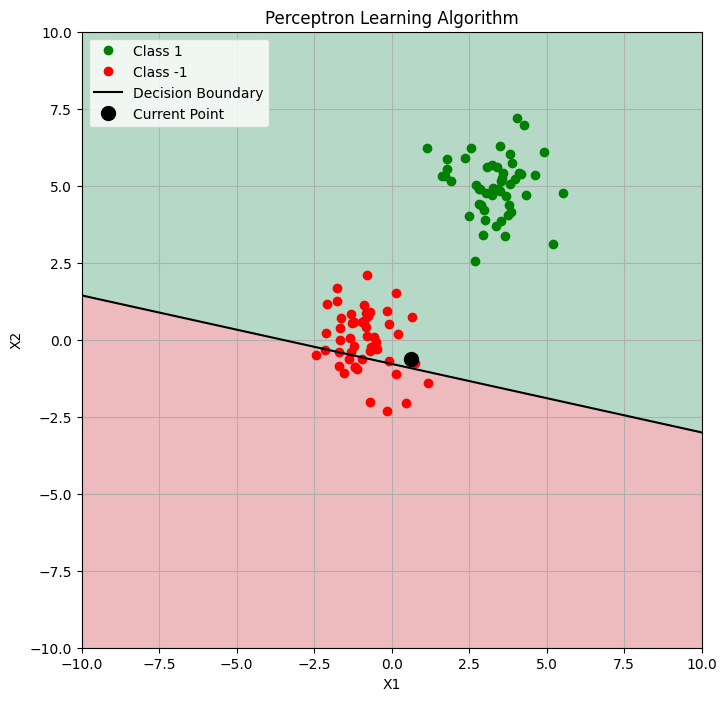

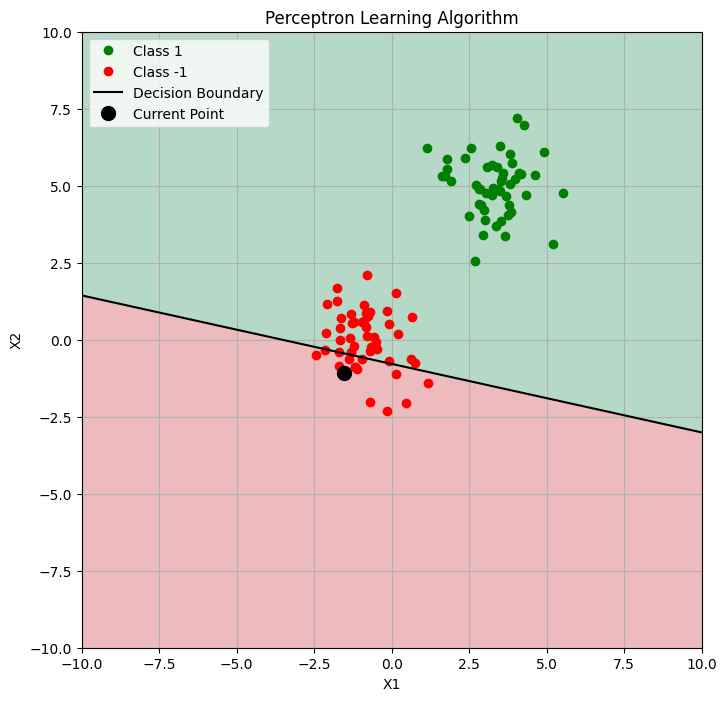

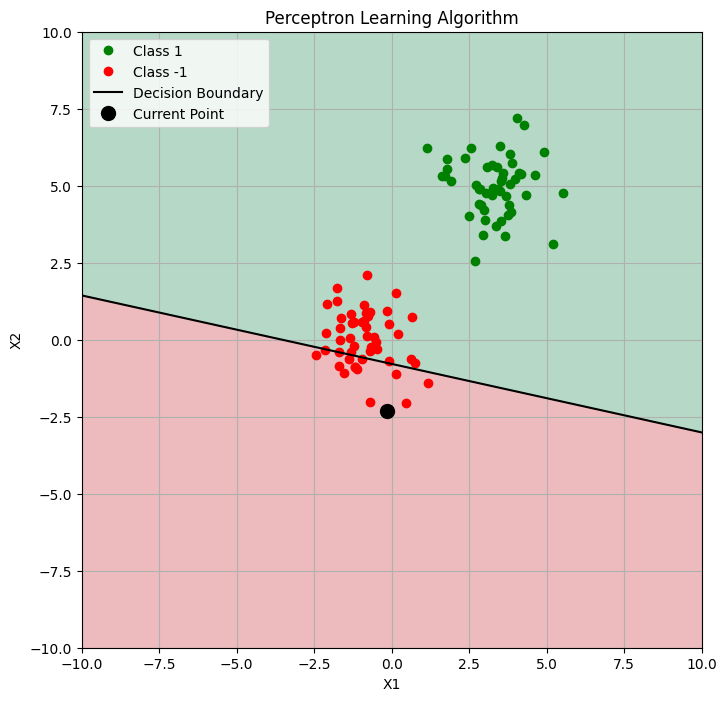

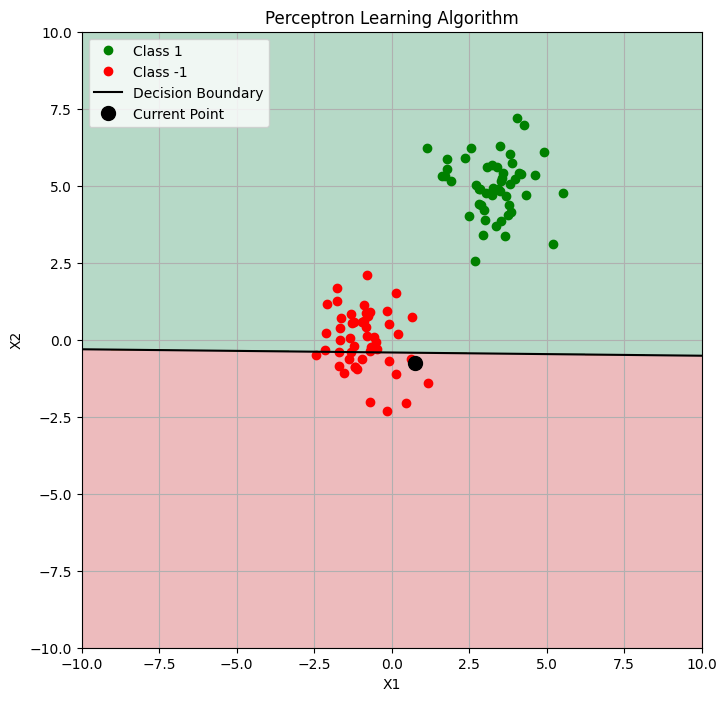

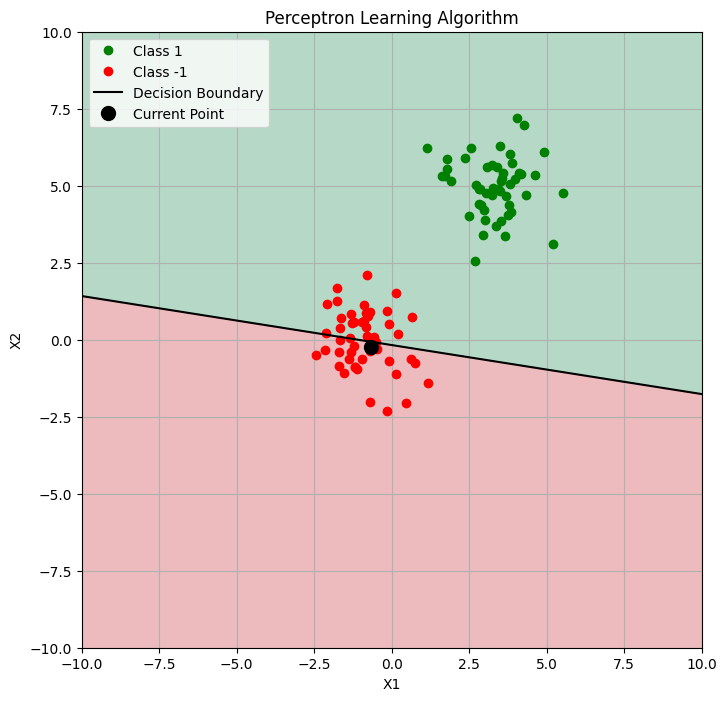

...

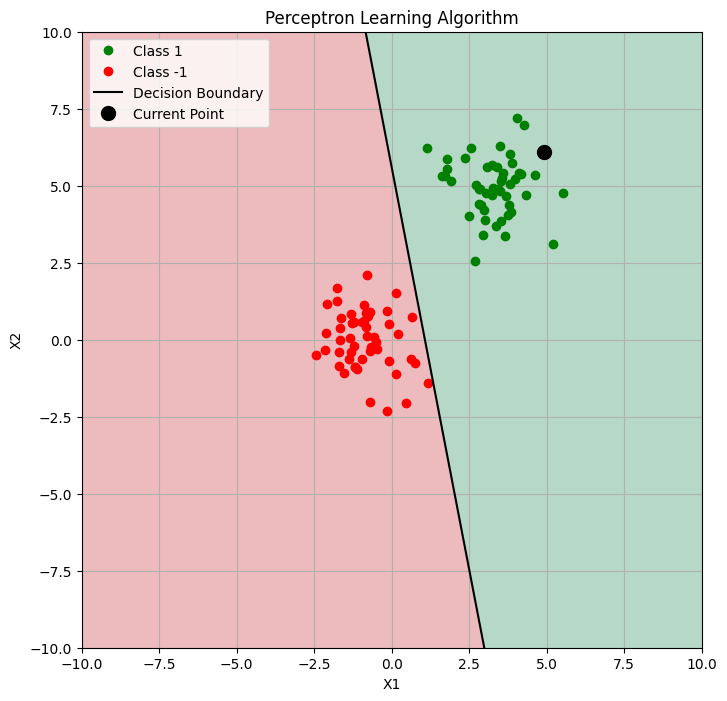

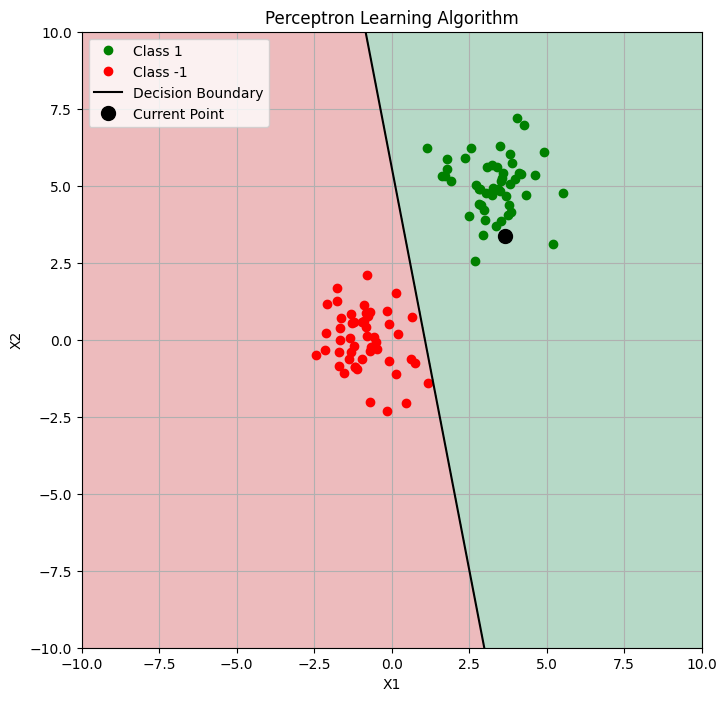

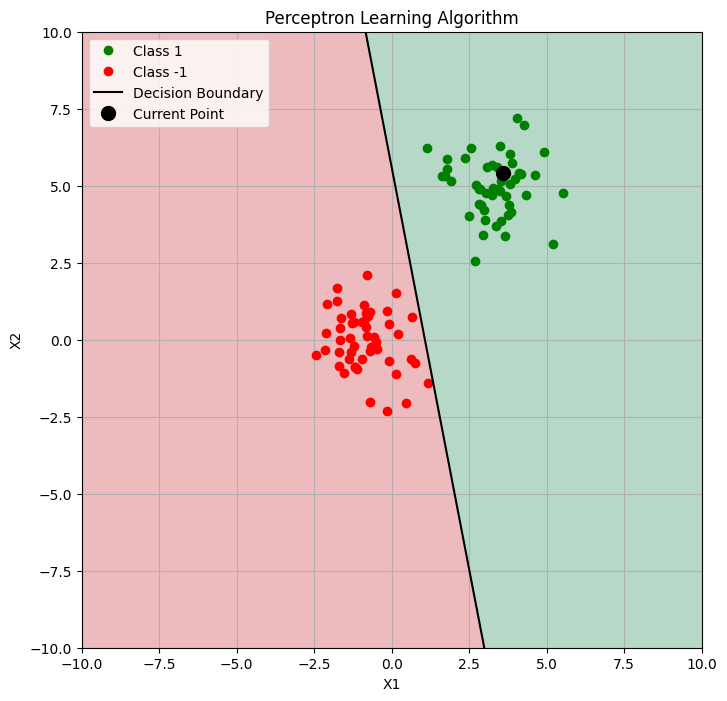

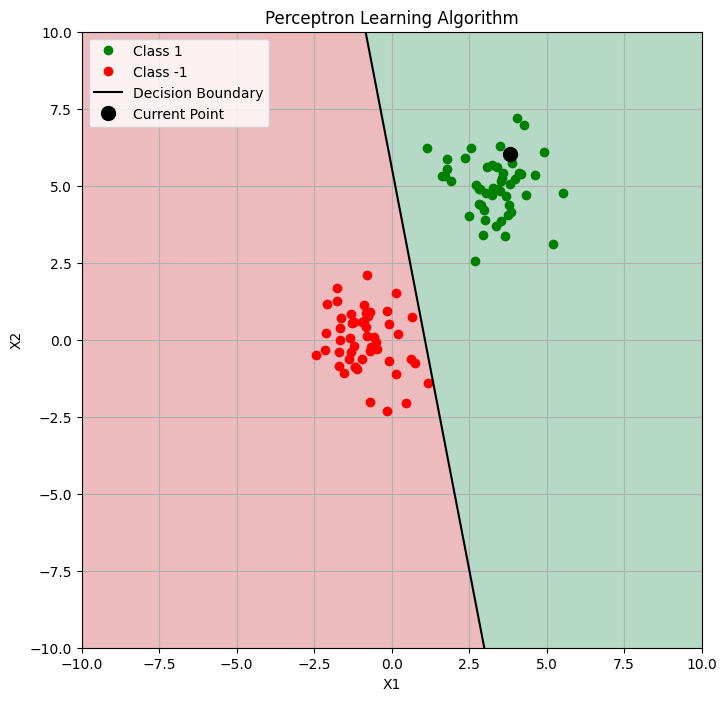

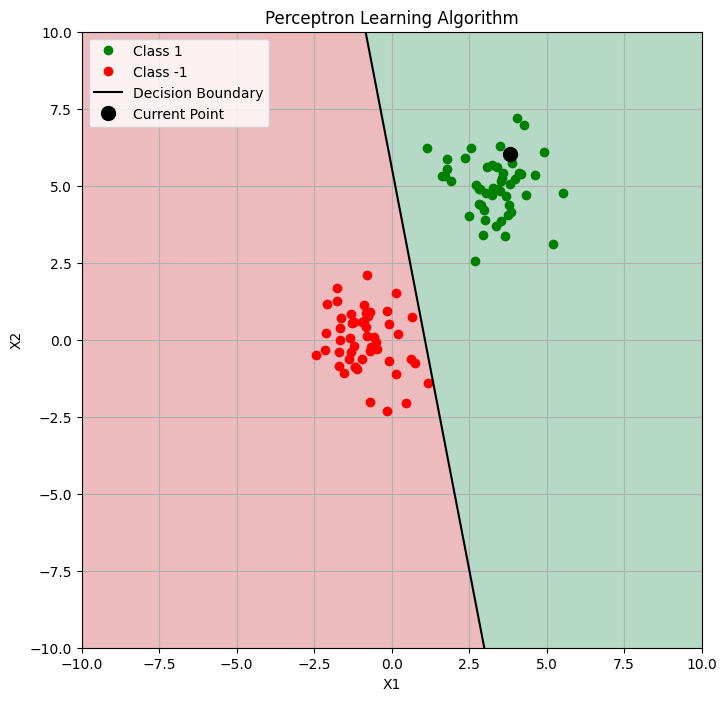

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Fri Feb 26 10:10:36 2021

@author: Vieira
"""

#%% Importar módulos
import numpy as np
import matplotlib.pyplot as plt

# Configurações iniciais
np.random.seed(1)  # Define a semente para reproducibilidade

# Parâmetros para geração de dados e plotagem
xlim = (-10, 10)
ylim = (-10, 10)
step = 0.02

#%% Gerar dados aleatórios
N = 50

# Duas classes de dados com distribuições normais diferentes
c1 = np.random.randn(N, 2) + np.array([-1, 0])
c2 = np.random.randn(N, 2) + np.array([3, 5])

# Concatenar os dados e definir os rótulos de classe
X = np.vstack((c1, c2))
y = np.vstack((-1 * np.ones((N, 1)), np.ones((N, 1))))

#%% Definir funções

def sgn(x):
    """ Função de ativação sgn(x), retorna 1 se x >= 0, -1 caso contrário. """
    return (1 if x >= 0 else -1)

def predict(w, x):
    """ Função de predição usando o vetor de pesos w e a entrada x. """
    return sgn(np.dot(w.T, x))

def get_dec_boundary(w):
    """ Função para obter a fronteira de decisão. """
    xx, yy = np.meshgrid(np.arange(xlim[0], xlim[1], step),
                         np.arange(ylim[0], ylim[1], step))
    samples = np.vstack([np.ones((xx.size)), xx.ravel(), yy.ravel()])
    z = np.dot(w.T, samples)
    z = np.where(z >= 0, 1, -1)  # Definir 1 para z >= 0 e -1 caso contrário
    return xx, yy, z.reshape(xx.shape)

def get_line(w):
    """ Função para obter a linha de separação calculada pelo vetor de pesos w. """
    x1 = np.linspace(xlim[0], xlim[1], 2)
    x2 = (-w[0] - w[1] * x1) / w[2]
    return x1, x2

def plot_data(X, y, w, ind=0):
    """ Função para plotar os dados, a linha de separação e a fronteira de decisão. """
    plt.figure(figsize=(8, 8))

    # Plotar os pontos das duas classes
    plt.plot(X[y.ravel() == 1, 0], X[y.ravel() == 1, 1], 'go', label='Class 1')
    plt.plot(X[y.ravel() == -1, 0], X[y.ravel() == -1, 1], 'ro', label='Class -1')

    # Plotar a linha de separação
    x1, x2 = get_line(w)
    plt.plot(x1, x2, '-k', label='Decision Boundary')

    # Destacar o ponto atual (X[ind, :])
    plt.plot(X[ind, 0], X[ind, 1], 'ko', markersize=10, label='Current Point')

    # Limites do gráfico
    plt.xlim(-10, 10)
    plt.ylim(-10, 10)

    # Plotar a região de decisão
    xx, yy, zz = get_dec_boundary(w)
    plt.contourf(xx, yy, zz, cmap=plt.cm.RdYlGn, alpha=0.3)

    # Configurações adicionais do gráfico
    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.title('Perceptron Learning Algorithm')
    plt.legend()
    plt.grid(True)
    plt.show()

# Inicializar pesos aleatórios normalizados
w = 10. * np.random.random((3, 1))
w = w / np.linalg.norm(w)

# Inicializar pesos com zero
# w = np.zeros((3, 1))

# Parâmetros de treinamento
epochs = range(2)
eta = 0.1

# Loop de treinamento
for epoch in epochs:
    for i in range(X.shape[0]):
        x = np.hstack([1, X[i, :]]).reshape((3, 1))
        y_gt = y[i]
        y_hat = predict(w, x)
        w = w + eta * (y_gt - y_hat) * x
        plot_data(X, y, w, i)

# Plotar o resultado final após o treinamento
plot_data(X, y, w, i)


# Alteração da taxa de aprendizagem

## Taxa de aprendizagem baixa (eta=0.1)


É possível perceber que com uma taxa de aprendizagem baixa o algoritmo converge mais lentamente, necessitando de um maior números de epochs para que tenha uma mudança; entretanto, pode ser mais estável.

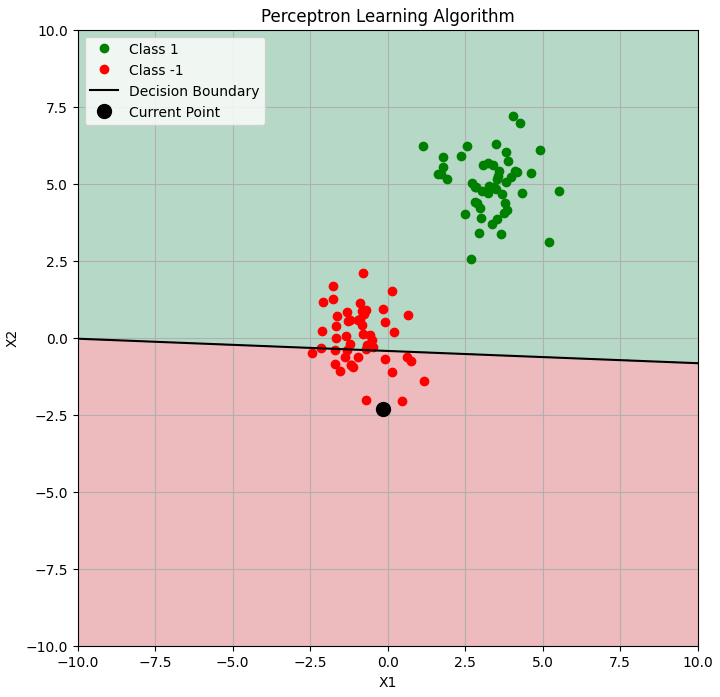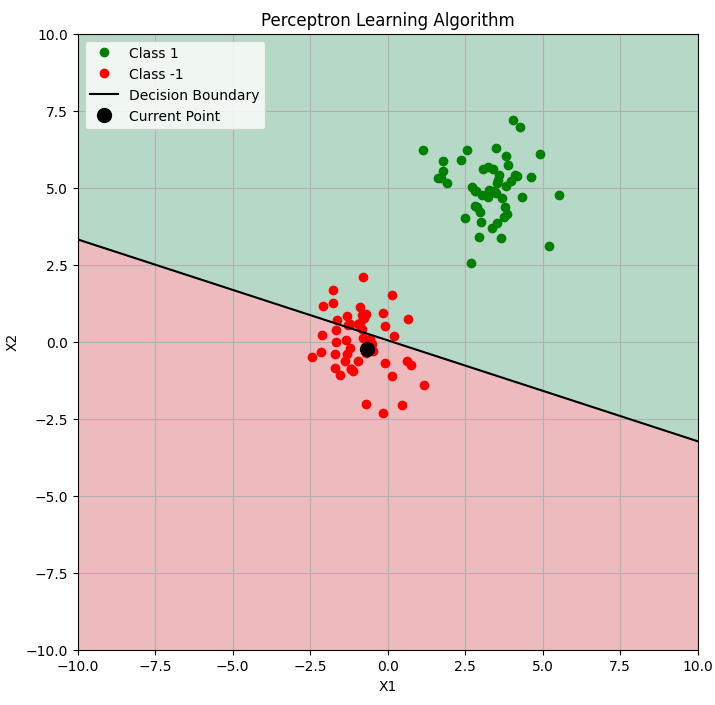

## Taxa de aprendizagem Alta (eta=1000)


É possível perceber que com uma taxa de aprendizagem alta os ajustes de pesos pesos são feitos mais rapidamentes, entretanto, pode aumentar o overshooting ou divergências.

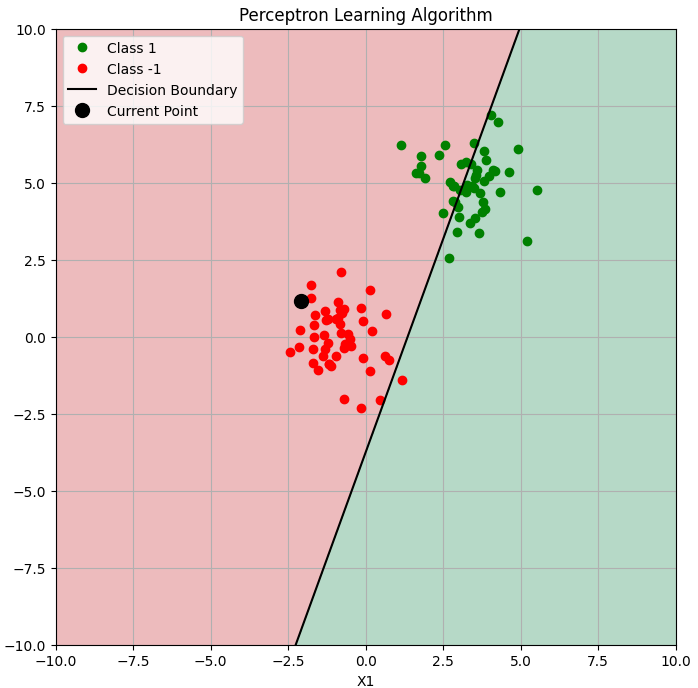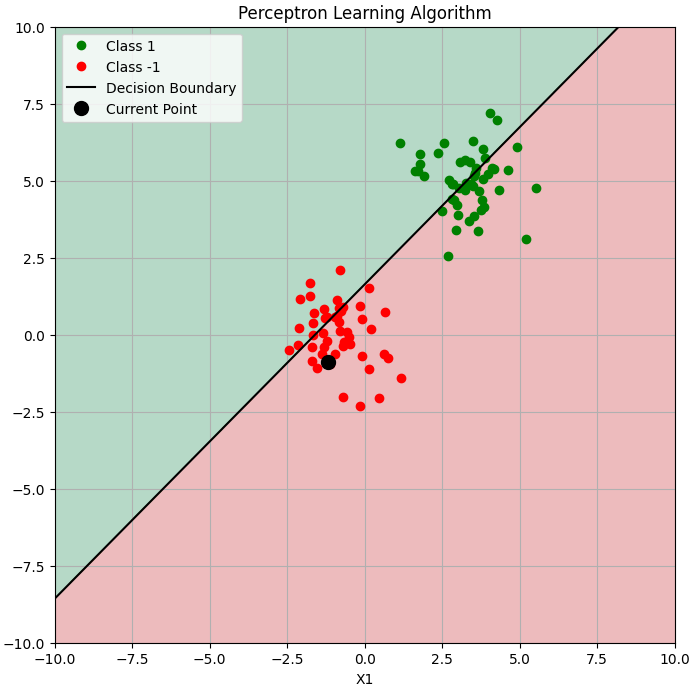

# Alterando a inicialização dos pesos

## Inicialização aleatória

Inicializando os pesos de forma aleatória é possível perceber que torna o treinamento mais lento e instável, podendo resultado em soluções subótimas.

## Inicialização dos pesos com 0

Percebi que levou a um treinamento mais lento em comparação com a inicialização aleatória e a linha final foi diferente em relação ao obtido com a inicialização aleatória.